In [1]:
from MLP import *
from sklearn import metrics
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt

In [2]:
sc = StandardScaler()

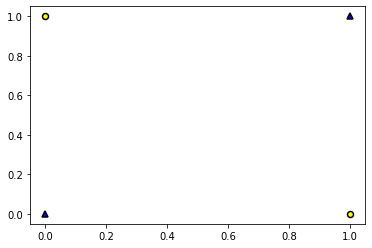

In [3]:
X = np.array([
    [0, 0],
    [0, 1],
    [1, 0],
    [1, 1]
])
y = np.array([
    [0],
    [1],
    [1],
    [0]
])
plt.plot(0, 0, '^', markeredgewidth=1.5, color=(0, 0, 1, 1), markeredgecolor=(0, 0, 0, 1))
plt.plot(0, 1, 'o', markeredgewidth=1.5, color=(1, 1, 0, 1), markeredgecolor=(0, 0, 0, 1))
plt.plot(1, 1, '^', markeredgewidth=1.5, color=(0, 0, 1, 1), markeredgecolor=(0, 0, 0, 1))
plt.plot(1, 0, 'o', markeredgewidth=1.5, color=(1, 1, 0, 1), markeredgecolor=(0, 0, 0, 1))

In [4]:
mlp = MultiLayerPerceptron(np.array([2, 3, 1]), 'meansquared', 'sigmoid')

In [5]:
mlp.learn(X, y, .1, 3000)

100%|████████████████████████████████████████████████████| 3000/3000 [00:03<00:00, 980.33it/s, loss=0.0138, accuracy=1]


In [6]:
N = 100
X = np.linspace(-1, 2, N)

In [7]:
X = np.array(np.meshgrid(X, X)).T.reshape(-1,2)
y = mlp.predictAll(X)

<IPython.core.display.Javascript object>


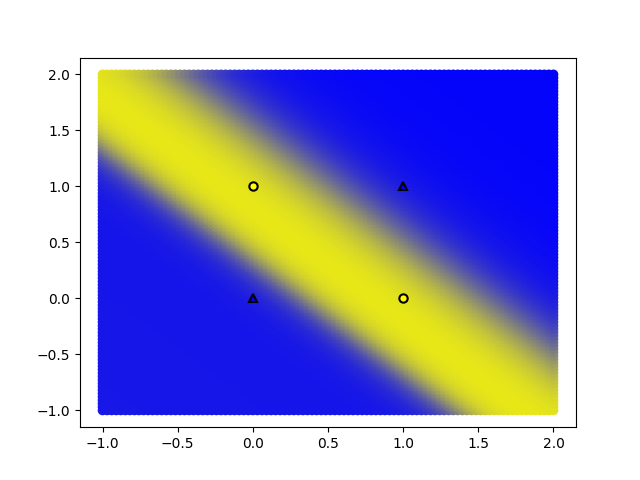

In [8]:
%matplotlib notebook
plt.scatter(X[:, 0], X[:, 1], c=np.hstack((y, y, 1 - y)))
plt.plot(0, 0, '^', markeredgewidth=1.5, color=(0, 0, 1, 1), markeredgecolor=(0, 0, 0, 1))
plt.plot(0, 1, 'o', markeredgewidth=1.5, color=(1, 1, 0, 1), markeredgecolor=(0, 0, 0, 1))
plt.plot(1, 1, '^', markeredgewidth=1.5, color=(0, 0, 1, 1), markeredgecolor=(0, 0, 0, 1))
plt.plot(1, 0, 'o', markeredgewidth=1.5, color=(1, 1, 0, 1), markeredgecolor=(0, 0, 0, 1))

<IPython.core.display.Javascript object>


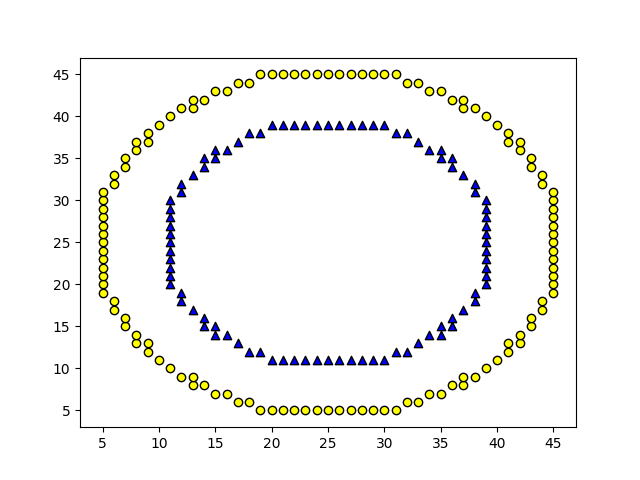

In [9]:
%matplotlib notebook
N = 50
center = int(N/2)
Y, X = np.ogrid[:N, :N]
circle = np.sqrt((X - center)**2 + (Y - center)**2).astype(int)
a = np.zeros((N, N))
a[circle==14] = 1
a[circle==20] = 2
X = np.argwhere(a==1)
y = np.zeros(X.shape[0])
X = np.append(X, np.argwhere(a==2), axis=0)
y = np.append(y, np.ones(len(np.argwhere(a==2))))
plt.scatter(X[y == 1, 0], X[y == 1, 1], marker='o', edgecolors=(0, 0, 0, 1), color=(1, 1, 0, 1))
plt.scatter(X[y == 0, 0], X[y == 0, 1], marker='^', edgecolors=(0, 0, 0, 1), color=(0, 0, 1, 1))

In [14]:
%%capture
%matplotlib notebook

plt.rcParams['animation.html'] = 'jshtml'
plt.rcParams['animation.embed_limit'] = 2**128
fig, ax = plt.subplots(figsize=(10, 10))
fig.set_size_inches(6, 6)
maxFrame = 100 # with maxFrame=200 will take around 2 hours
# initialize data

N = 50
center = int(N/2)

NN = 70
XX = np.linspace(0, N, NN)
XX = np.array(np.meshgrid(XX, XX)).T.reshape(-1,2)
XX_sc = sc.fit_transform(XX)

Y, X = np.ogrid[:N, :N]
circle = np.sqrt((X - center)**2 + (Y - center)**2).astype(int)
a = np.zeros((N, N))
a[circle==14] = 1
a[circle==20] = 2
X = np.argwhere(a==1)
y = np.zeros(X.shape[0])
X = np.append(X, np.argwhere(a==2), axis=0)
y = np.append(y, np.ones(len(np.argwhere(a==2))))

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

x_train2 = x_train.copy()
y_train2 = y_train.copy()

x_train = np.append(x_train, XX, axis=0)
x_train = sc.fit_transform(x_train)
x_train = x_train[:-XX.shape[0]]

y_train = y_train.reshape((-1, 1))

mlp = MultiLayerPerceptron(np.array([2, 5, 1]), 'meansquared', 'sigmoid')


# create animation
def animate(frame):
    mlp.learn(x_train, y_train, .3, 1)
    ax.set_title(r'epoch = {}'.format(frame))
    ax.set_xticks([])
    ax.set_yticks([])
    
    yy = mlp.predictAll(XX_sc)
    ax.scatter(XX[:, 0], XX[:, 1], color=np.hstack((yy, yy, 1 - yy)))
    ax.scatter(x_train2[y_train2 == 1, 0], x_train2[y_train2 == 1, 1], marker='o', edgecolors=(0, 0, 0, 1), color=(1, 1, 0, 1))
    ax.scatter(x_train2[y_train2 == 0, 0], x_train2[y_train2 == 0, 1], marker='^', edgecolors=(0, 0, 0, 1), color=(0, 0, 1, 1))
    
anim = FuncAnimation(fig,animate,frames = np.arange(1,maxFrame + 1) ,interval=50)
# anim.save('200.gif')
anim

In [15]:
anim

In [ ]:
N = 50
center = int(N/2)

sc = StandardScaler()

NN = 70
XX = np.linspace(0, N, NN)
XX = np.array(np.meshgrid(XX, XX)).T.reshape(-1,2)

Y, X = np.ogrid[:N, :N]
circle = np.sqrt((X - center)**2 + (Y - center)**2).astype(int)
a = np.zeros((N, N))
a[circle==14] = 1
a[circle==20] = 2
X = np.argwhere(a==1)
y = np.zeros(X.shape[0])
X = np.append(X, np.argwhere(a==2), axis=0)
y = np.append(y, np.ones(len(np.argwhere(a==2))))

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
x_train = np.append(x_train, XX, axis=0)
x_train = sc.fit_transform(x_train)
x_train = x_train[:-XX.shape[0]]

y_train = y_train.reshape((-1, 1))
mlp = MultiLayerPerceptron(np.array([2, 5, 1]), 'meansquared', 'sigmoid')

mlp.learn(x_train, y_train, .3, 200)

In [ ]:
yy = mlp.predictAll(sc.fit_transform(XX))
fig, ax = plt.subplots(figsize=(10, 10))
fig.set_size_inches(6, 6)
ax.scatter(XX[:, 0], XX[:, 1], color=np.hstack((yy, yy, 1 - yy)))
ax.scatter(x_test[y_test == 1, 0], x_test[y_test == 1, 1], marker='o', edgecolors=(0, 0, 0, 1), color=(1, 1, 0, 1))
ax.scatter(x_test[y_test == 0, 0], x_test[y_test == 0, 1], marker='^', edgecolors=(0, 0, 0, 1), color=(0, 0, 1, 1))

In [ ]:
x_test2 = np.append(x_test, XX, axis=0)
x_test2 = sc.fit_transform(x_test2)
x_test2 = x_test2[:-XX.shape[0]]

In [ ]:
%%capture
%matplotlib notebook
plt.rcParams['animation.html'] = 'jshtml'
plt.rcParams['animation.embed_limit'] = 2**128
fig, ax = plt.subplots(figsize=(10, 10))
fig.set_size_inches(6, 6)
ax.scatter(XX[:, 0], XX[:, 1], color=np.hstack((yy, yy, 1 - yy)))

y_pred = np.round(mlp.predictAll(x_test2)).astype(int)
cnt = 0
def animate2(frame):
    global cnt
    if frame != -1:
        cnt += y_pred[frame,0] == y_test[frame]
    accuracy = 1.0 if frame == -1 else cnt/(frame+1)
    ax.set_title(r'accuracy = {}'.format(accuracy))
    ax.set_xticks([])
    ax.set_yticks([])
    if frame == -1:
        return
    marker = 'o' if y_test[frame] == 1 else '^'
    color = (1, 1, 0, 1) if y_test[frame] == 1 else (0, 0, 1, 1)
    ax.scatter(x_test[frame, 0], x_test[frame, 1], marker=marker, edgecolors=(0, 0, 0, 1), c=color)

anim = FuncAnimation(fig, animate2, frames = np.arange(-1, len(x_test)) ,interval=150)
# anim.save('predictions.gif')
anim

In [ ]:
anim